# Quantum Billiards

This problem is a free particle confined to a 2D region with hard walls, i.e., billiards tables. For various different tables shapes one gets famous behavior (e.g. particle in a box), or chaotic behavior (stadium billiard). We'll try to realize this in the hackathon.

The TLDR is that at the end of the day we identify some "quantum scarring" by computing the inverse participation ratio of the wavefunctions after having solved for a lot of eigenstates. These quantum scars look like classical periodic orbits in the billiard, with quantum uncertainty overlaid.

For a classic reference, see the 1984 PRL paper by Heller: https://journals.aps.org/prl/abstract/10.1103/PhysRevLett.53.1515

### Simple Example: Particle in a 2d Box

CoPilot suggested that starting with a particle in a box is a good start. They pointed out that for simple enough boundary conditions there are analytic solutions, but I don't want this because I want to be able to handle the general case.

It suggested a finite difference method as a starting place.

In [16]:
import numpy as np
from scipy.sparse import diags, lil_matrix
from scipy.sparse.linalg import eigsh
from matplotlib import pyplot as plt

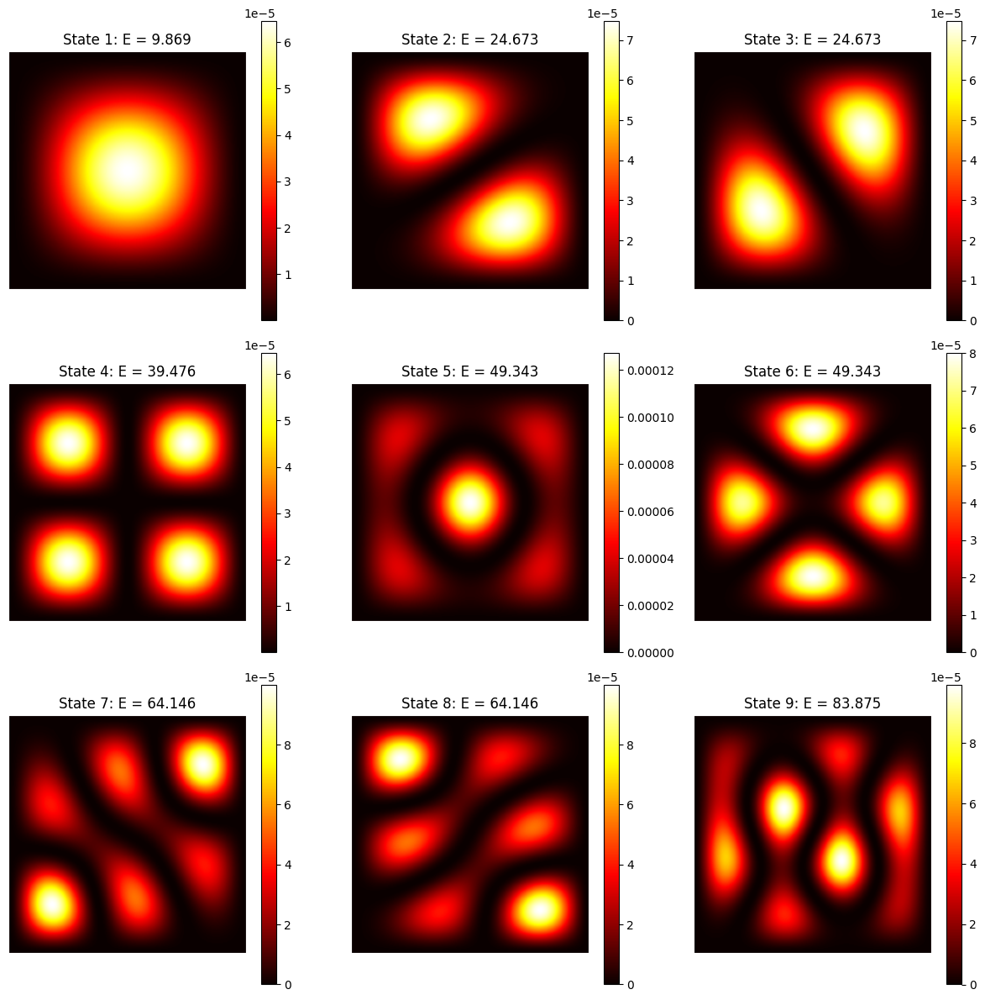

9.869604401089358 24.674011002723397 24.674011002723397 39.47841760435743 49.34802200544679 49.34802200544679


In [23]:
n_eigenstates = 10

# a mask for the billiard table, True inside table, False outside
shape_mask = np.ones((250,250), dtype=bool) # shape mask for box 2d
Nx, Ny = shape_mask.shape
Lx, Ly = 1.0, 1.0
dx, dy = Lx/(Nx-1), Ly/(Ny-1)

# counting interior points
interior = shape_mask.copy()
interior[0, :] = interior[-1, :] = False
interior[:, 0] = interior[:, -1] = False
N_interior = np.sum(interior)

# Map from 2d points to 1d index
point_to_index = -np.ones((Ny, Nx), dtype=int)
point_to_index[interior] = np.arange(N_interior)

# Build the Hamiltonian matrix using finite difference method
H = lil_matrix((N_interior, N_interior))

idx = 0
for i in range(Ny):
    for j in range(Nx):
        if not interior[i,j]:
            continue

        H[idx,idx] = -2.0/dx**2 - 2.0/dy**2  # center point

        if interior[i-1, j]:
                H[idx, point_to_index[i-1, j]] = 1/dy**2
        if interior[i+1, j]:
            H[idx, point_to_index[i+1, j]] = 1/dy**2
        if interior[i, j-1]:
            H[idx, point_to_index[i, j-1]] = 1/dx**2
        if interior[i, j+1]:
            H[idx, point_to_index[i, j+1]] = 1/dx**2
        
        idx += 1     

# Solve eigenvalue problem 
H = -0.5 * H.tocsr()
eigenvalues, eigenvectors = eigsh(H, k=n_eigenstates, which='SM')  

# Get wavefunctions 
wavefunctions = []
for n in range(n_eigenstates):
    psi = np.zeros((Ny, Nx))
    psi[interior] = eigenvectors[:, n]
    wavefunctions.append(psi)

# Plot the first 9 eigenstates
fig, axes = plt.subplots(3, 3, figsize=(12, 12))
for i, ax in enumerate(axes.flat):
    psi = wavefunctions[i]
    psi[~interior] = np.nan  # Mask exterior
    
    im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot')
    ax.set_title(f'State {i+1}: E = {eigenvalues[i]:.3f}')
    ax.axis('off')
    plt.colorbar(im, ax=ax)

plt.tight_layout()
plt.show()

# theoretical energies 
Enm = lambda n, m: np.pi**2 * (n**2/Lx**2 + m**2/Ly**2) / 2.0
print(Enm(1,1), Enm(1,2), Enm(2,1), Enm(2,2), Enm(3,1), Enm(1,3))

# Packaging Above Code for Abstraction / Simplification

In [ ]:
def solve_quantum_billiard(shape_mask, Lx, Ly, n_eigenstates=10):
    """
    Solve the quantum billiard problem for an arbitrary shape using finite differences.
    
    Parameters
    ----------
    shape_mask : ndarray (Ny, Nx) of bool
        Boolean mask where True indicates interior of billiard, False exterior
    Lx, Ly : float
        Physical dimensions of the domain
    n_eigenstates : int, optional
        Number of lowest energy eigenstates to compute (default: 10)
    
    Returns
    -------
    eigenvalues : ndarray (n_eigenstates,)
        Energy eigenvalues in ascending order
    wavefunctions : list of ndarray (Ny, Nx)
        Corresponding wavefunctions on the 2D grid
    interior : ndarray (Ny, Nx) of bool
        Mask of interior points (excluding boundaries)
    """
    Ny, Nx = shape_mask.shape
    dx = Lx / (Nx - 1)
    dy = Ly / (Ny - 1)
    
    # Identify interior points (excluding boundary)
    interior = shape_mask.copy()
    interior[0, :] = interior[-1, :] = False
    interior[:, 0] = interior[:, -1] = False
    N_interior = np.sum(interior)
    
    # Create mapping from 2D grid to 1D vector
    point_to_index = -np.ones((Ny, Nx), dtype=int)
    point_to_index[interior] = np.arange(N_interior)
    
    # Build Hamiltonian matrix using 5-point stencil
    H = lil_matrix((N_interior, N_interior))
    
    idx = 0
    for i in range(Ny):
        for j in range(Nx):
            if not interior[i, j]:
                continue
            
            # Diagonal (center point)
            H[idx, idx] = -2.0/dx**2 - 2.0/dy**2
            
            # Off-diagonal (neighboring points)
            if interior[i-1, j]:
                H[idx, point_to_index[i-1, j]] = 1/dy**2
            if interior[i+1, j]:
                H[idx, point_to_index[i+1, j]] = 1/dy**2
            if interior[i, j-1]:
                H[idx, point_to_index[i, j-1]] = 1/dx**2
            if interior[i, j+1]:
                H[idx, point_to_index[i, j+1]] = 1/dx**2
            
            idx += 1
    
    # Solve eigenvalue problem: -0.5 * ∇²ψ = E*ψ (with ℏ²/m = 1)
    H = -0.5 * H.tocsr()
    eigenvalues, eigenvectors = eigsh(H, k=n_eigenstates, which='SM')
    
    # Reconstruct 2D wavefunctions
    wavefunctions = []
    for n in range(n_eigenstates):
        psi = np.zeros((Ny, Nx))
        psi[interior] = eigenvectors[:, n]
        wavefunctions.append(psi)
    
    return eigenvalues, wavefunctions, interior


def plot_eigenstates(wavefunctions, eigenvalues, interior, n_states=9, figsize=(12, 12), cmap='hot'):
    """
    Plot the probability densities of quantum billiard eigenstates.
    
    Parameters
    ----------
    wavefunctions : list of ndarray
        List of 2D wavefunctions
    eigenvalues : ndarray
        Corresponding energy eigenvalues
    interior : ndarray of bool
        Mask indicating interior points
    n_states : int, optional
        Number of states to plot (default: 9)
    figsize : tuple, optional
        Figure size (default: (12, 12))
    cmap : str, optional
        Colormap name (default: 'hot')
    """
    n_states = min(n_states, len(wavefunctions))
    n_rows = int(np.ceil(np.sqrt(n_states)))
    n_cols = int(np.ceil(n_states / n_rows))
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    if n_states == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    for i in range(n_states):
        psi = wavefunctions[i].copy()
        psi[~interior] = np.nan  # Mask exterior
        
        im = axes[i].imshow(np.abs(psi)**2, origin='lower', cmap=cmap)
        axes[i].set_title(f'State {i+1}: E = {eigenvalues[i]:.3f}')
        axes[i].axis('off')
        plt.colorbar(im, ax=axes[i])
    
    # Hide unused subplots
    for i in range(n_states, len(axes)):
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()


# ============================================================================
# Shape Creation Functions
# ============================================================================

def create_rectangle(Nx, Ny):
    """Create a rectangular billiard mask."""
    return np.ones((Ny, Nx), dtype=bool)


def create_circle(Nx, Ny, radius=0.8):
    """Create a circular billiard mask."""
    x = np.linspace(-1, 1, Nx)
    y = np.linspace(-1, 1, Ny)
    X, Y = np.meshgrid(x, y)
    return X**2 + Y**2 <= radius**2


def create_ellipse(Nx, Ny, a=1.0, b=0.6):
    """Create an elliptical billiard mask."""
    x = np.linspace(-1.2, 1.2, Nx)
    y = np.linspace(-1.2, 1.2, Ny)
    X, Y = np.meshgrid(x, y)
    return (X/a)**2 + (Y/b)**2 <= 1


def create_stadium(Nx, Ny, length_ratio=0.3):
    """Create a stadium billiard mask (rectangle with semicircular ends)."""
    L = length_ratio
    # Extend coordinate range to fit the full stadium
    x_max = L + 1.0  # semicircle radius = 1
    x = np.linspace(-x_max, x_max, Nx)
    y = np.linspace(-1.2, 1.2, Ny)  # Add some padding in y too
    X, Y = np.meshgrid(x, y)
    
    # Rectangle in middle
    mask = (np.abs(X) <= L) & (np.abs(Y) <= 1)
    # Left semicircle
    mask |= ((X + L)**2 + Y**2 <= 1) & (X < -L)
    # Right semicircle
    mask |= ((X - L)**2 + Y**2 <= 1) & (X > L)
    
    return mask


def create_triangle(Nx, Ny):
    """Create a triangular billiard mask."""
    x = np.linspace(-1, 1, Nx)
    y = np.linspace(-1, 1, Ny)
    X, Y = np.meshgrid(x, y)
    return (Y >= -0.8) & (Y <= 0.5*X + 0.8) & (Y <= -0.5*X + 0.8)

Finally, we want to have a method, the inverse participation ratio, that identifies how localized a wavefunction is. This is defined as:
$ I = \int |\psi(x)|^4 dx $
For a discrete wavefunction, this becomes:
$ I = \sum_i |\psi_i|^4 \Delta x $

In [62]:
def compute_ipr(psi, interior):
    """
    Compute Inverse Participation Ratio.
    Higher values indicate more localization (potential scarring).
    """
    psi_interior = psi[interior]
    psi4 = np.sum(np.abs(psi_interior)**4)
    psi2 = np.sum(np.abs(psi_interior)**2)
    return psi4 / (psi2**2)

# Usage Examples

Now you can easily solve any quantum billiard problem!

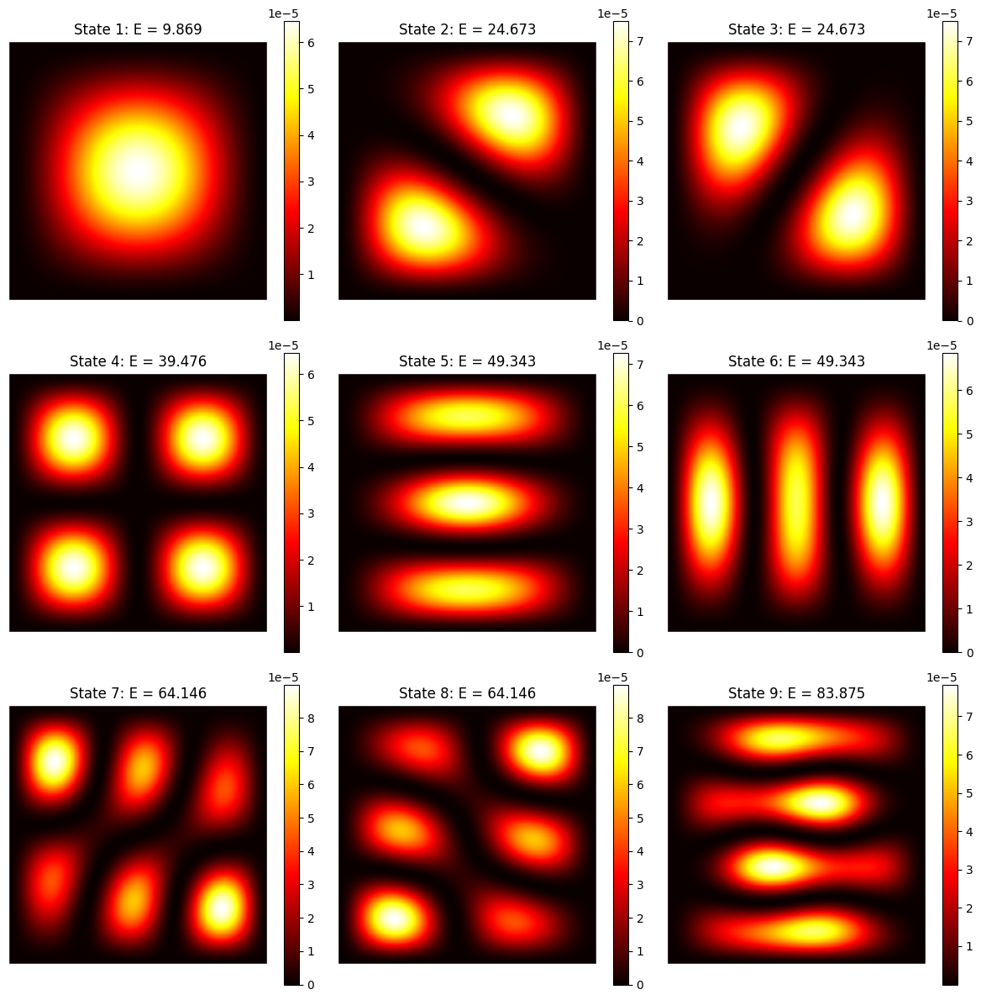

Theoretical energies:
E(1,1) = 9.870, E(1,2) = 24.674, E(2,1) = 24.674
E(2,2) = 39.478, E(1,3) = 49.348, E(3,1) = 49.348


In [37]:
# Example 1: Rectangle (reproduce your original result)
shape = create_rectangle(250, 250)
eigenvalues, wavefunctions, interior = solve_quantum_billiard(shape, Lx=1.0, Ly=1.0, n_eigenstates=10)
plot_eigenstates(wavefunctions, eigenvalues, interior, n_states=9)

# Compare with theory
Enm = lambda n, m: np.pi**2 * (n**2/1.0**2 + m**2/1.0**2) / 2.0
print("Theoretical energies:")
print(f"E(1,1) = {Enm(1,1):.3f}, E(1,2) = {Enm(1,2):.3f}, E(2,1) = {Enm(2,1):.3f}")
print(f"E(2,2) = {Enm(2,2):.3f}, E(1,3) = {Enm(1,3):.3f}, E(3,1) = {Enm(3,1):.3f}")

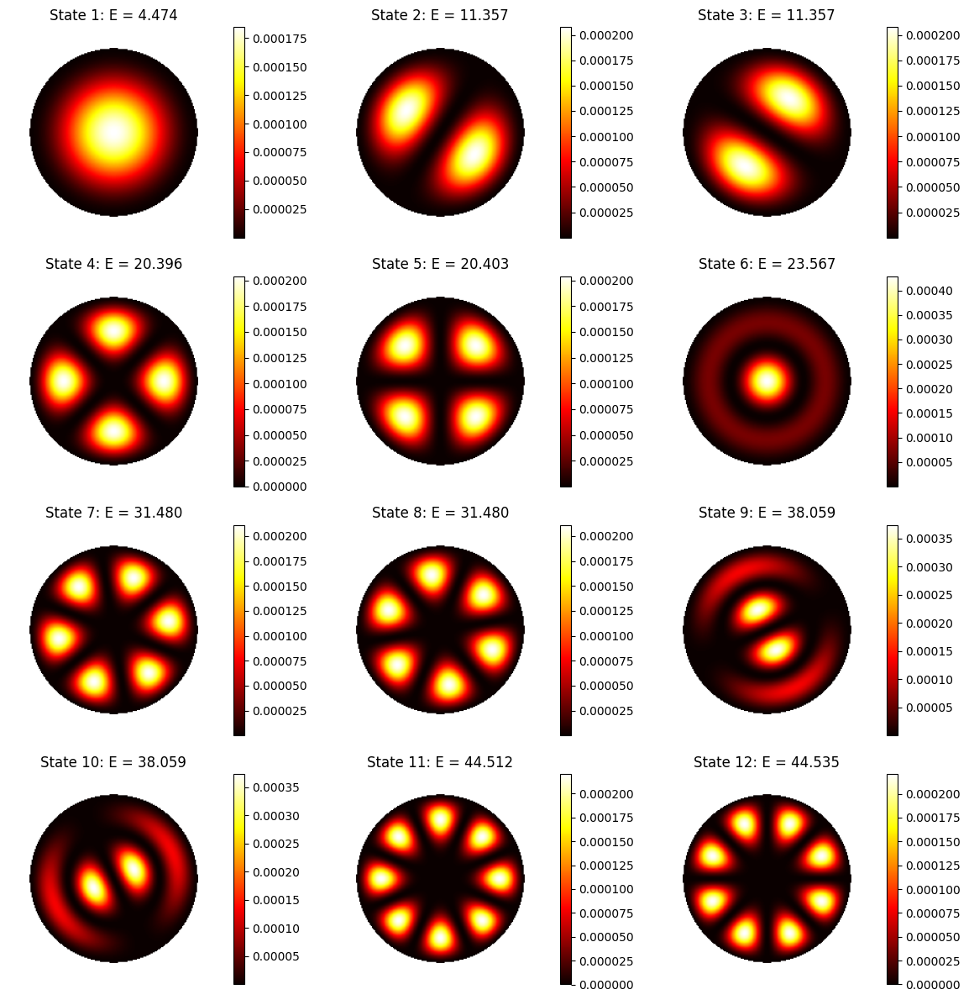

In [38]:
# Example 2: Circle
shape = create_circle(200, 200, radius=0.8)
eigenvalues, wavefunctions, interior = solve_quantum_billiard(shape, Lx=2.0, Ly=2.0, n_eigenstates=12)
plot_eigenstates(wavefunctions, eigenvalues, interior, n_states=12)

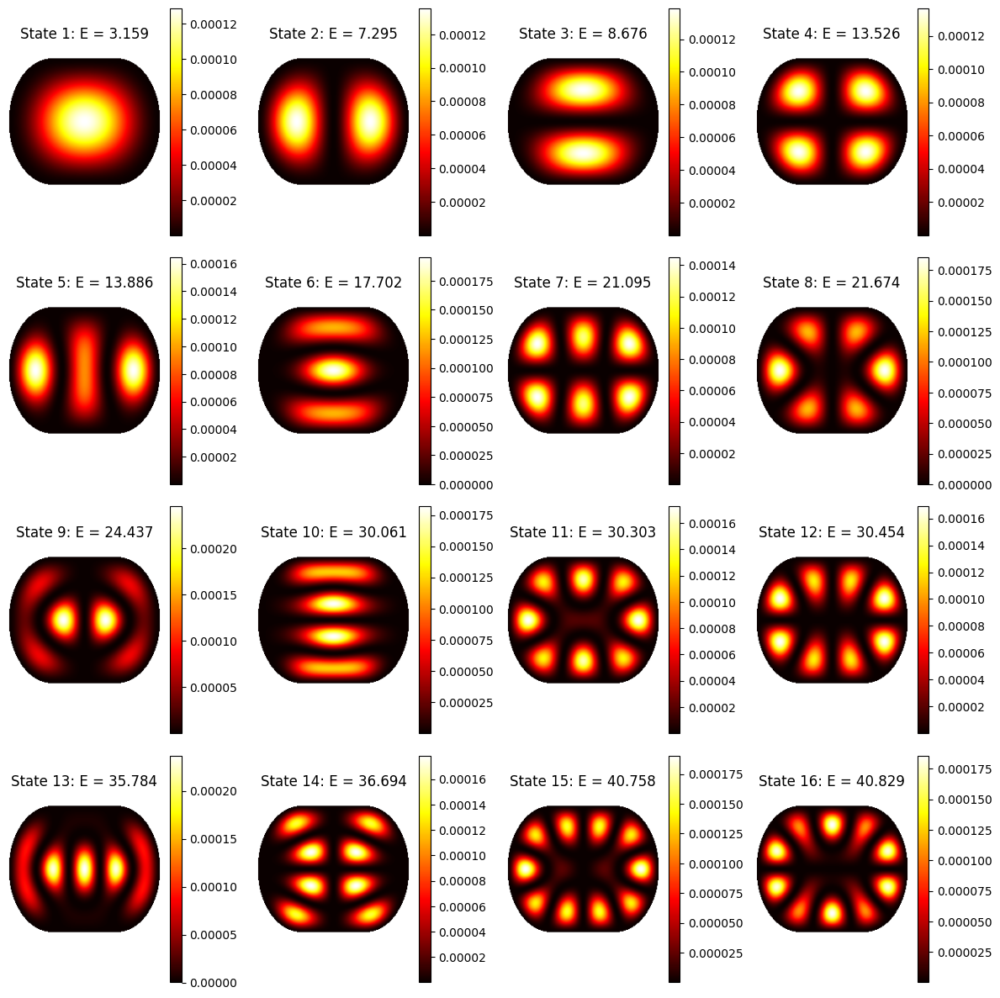

In [57]:
# Example 3: Stadium (classically chaotic!)
shape = create_stadium(200, 200, length_ratio=0.75)
eigenvalues, wavefunctions, interior = solve_quantum_billiard(shape, Lx=2.0, Ly=2.0, n_eigenstates=16)
plot_eigenstates(wavefunctions, eigenvalues, interior, n_states=16)

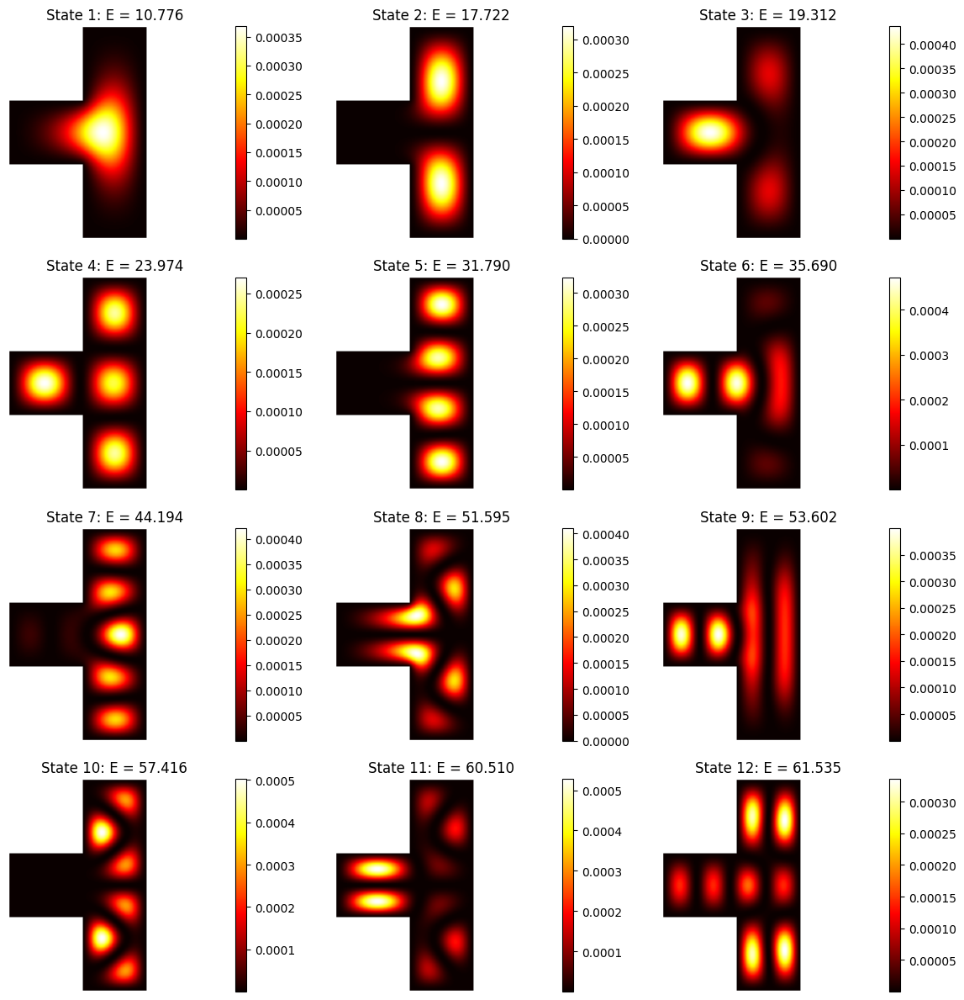

In [40]:
# Example 4: Custom shape - L-shaped billiard
def create_L_shape(Nx, Ny):
    """Create an L-shaped billiard."""
    x = np.linspace(-1, 1, Nx)
    y = np.linspace(-1, 1, Ny)
    X, Y = np.meshgrid(x, y)
    
    # Vertical part of L
    vertical = (X >= -0.3) & (X <= 0.3) & (Y >= -1) & (Y <= 1)
    # Horizontal part of L
    horizontal = (X >= -1) & (X <= 0.3) & (Y >= -0.3) & (Y <= 0.3)
    
    return vertical | horizontal

shape = create_L_shape(200, 200)
eigenvalues, wavefunctions, interior = solve_quantum_billiard(shape, Lx=2.0, Ly=2.0, n_eigenstates=12)
plot_eigenstates(wavefunctions, eigenvalues, interior, n_states=12)

# Scarring

Quantum scarring is a fascinating phenomenon where certain eigenstates of a quantum system exhibit enhanced probability density along the paths of classical periodic orbits. This occurs in systems where the classical dynamics are chaotic, such as in stadium-shaped billiards.

In [60]:
shape = create_stadium(200, 200, length_ratio=0.3)
eigenvalues, wavefunctions, interior = solve_quantum_billiard(
    shape, Lx=2.0, Ly=2.0, n_eigenstates=150  # Get more states!
)

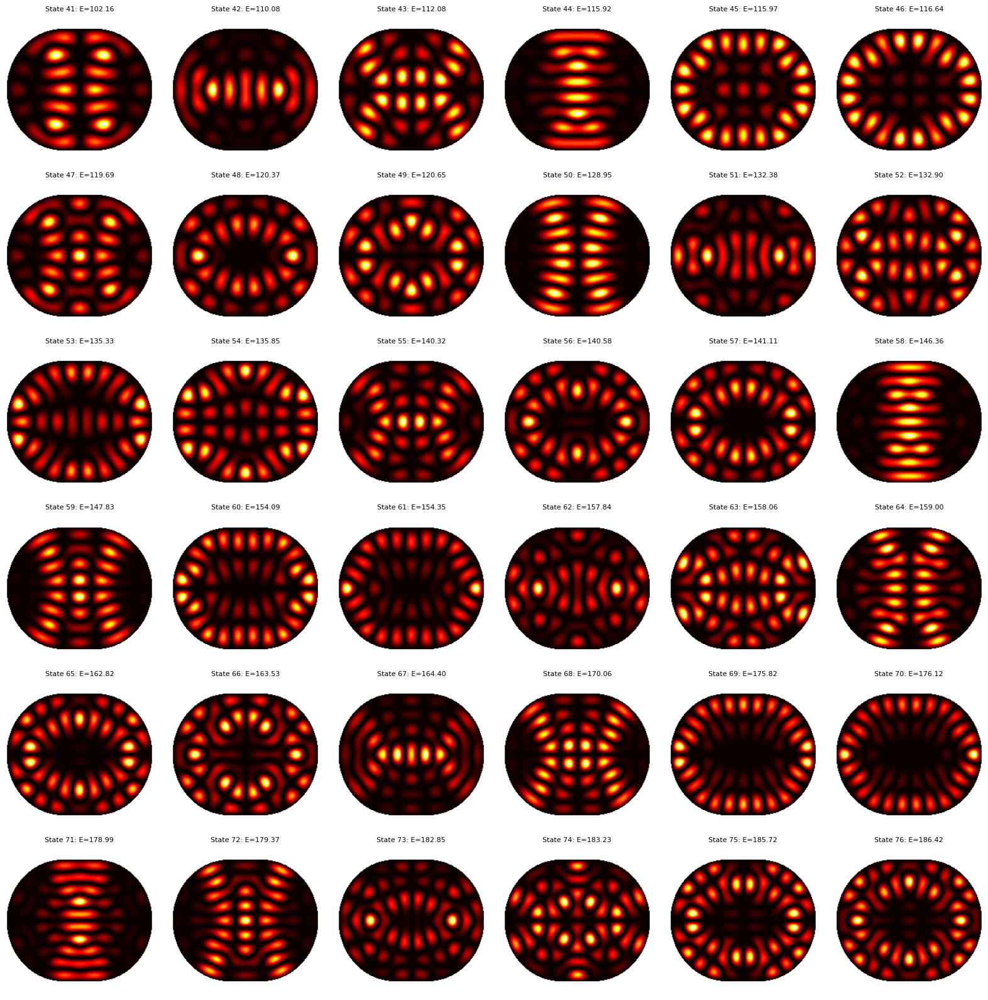

In [77]:
# Look at states 15-50, not just 1-9
fig, axes = plt.subplots(6, 6, figsize=(16, 16))
for i, ax in enumerate(axes.flat):
    state_idx = i + 40  # Start from state 15
    if state_idx < len(wavefunctions):
        psi = wavefunctions[state_idx]
        psi[~interior] = np.nan
        
        im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot', 
                      interpolation='bilinear')
        ax.set_title(f'State {state_idx+1}: E={eigenvalues[state_idx]:.2f}', 
                    fontsize=8)
        ax.axis('off')

plt.tight_layout()
plt.show()

In [67]:
shape = create_stadium(150, 150, length_ratio=0.3)
stadium_eigenvalues, stadium_wavefunctions, stadium_interior = solve_quantum_billiard(
    shape, Lx=2.0, Ly=2.0, n_eigenstates=2500  # Get more states!
)

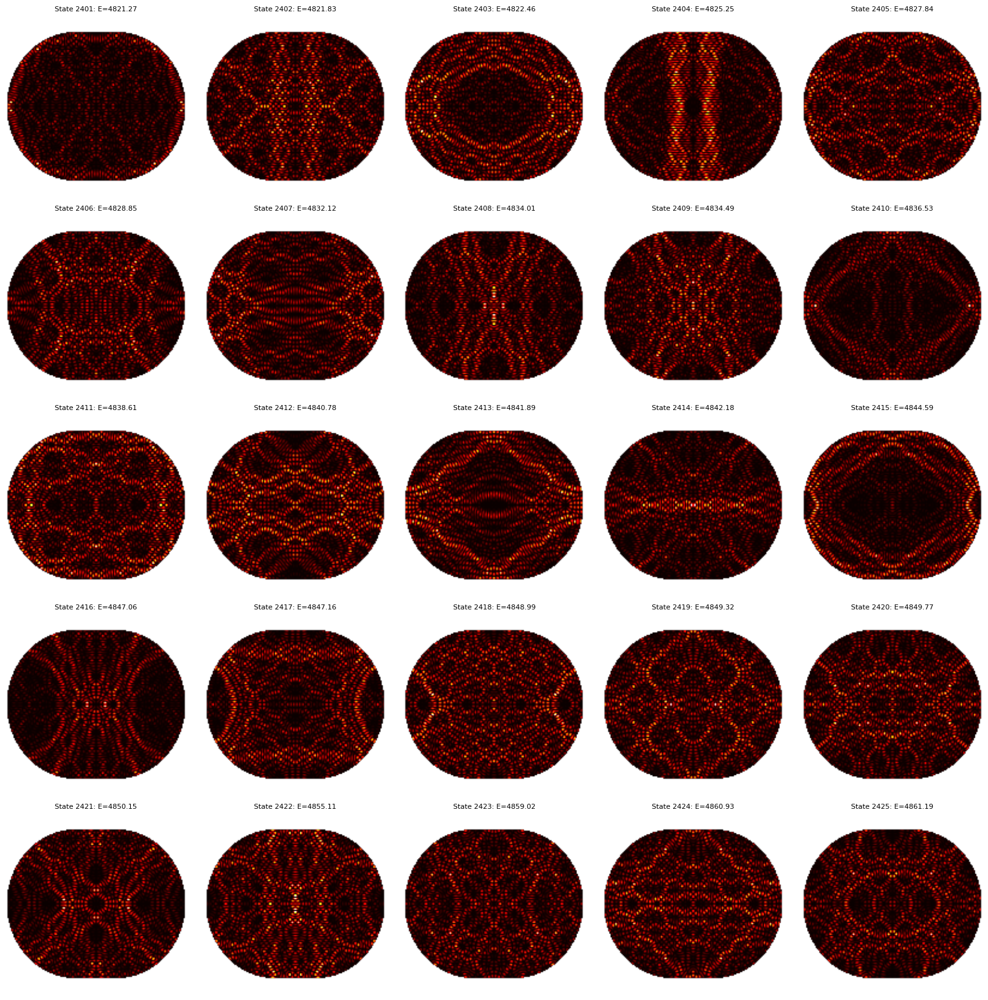

In [69]:
fig, axes = plt.subplots(5, 5, figsize=(16, 16))
for i, ax in enumerate(axes.flat):
    state_idx = i + 2400  # Start from state 15
    if state_idx < len(stadium_wavefunctions):
        psi = stadium_wavefunctions[state_idx]
        psi[~stadium_interior] = np.nan

        im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot',
                      interpolation='bilinear')
        ax.set_title(f'State {state_idx+1}: E={stadium_eigenvalues[state_idx]:.2f}',
                    fontsize=8)
        ax.axis('off')

plt.tight_layout()
plt.show()

State 1155 (IPR=2.49e-04)
State 1852 (IPR=2.49e-04)
State 1564 (IPR=2.49e-04)
State 774 (IPR=2.49e-04)
State 656 (IPR=2.50e-04)
State 531 (IPR=2.50e-04)
State 1601 (IPR=2.50e-04)
State 300 (IPR=2.50e-04)
State 1051 (IPR=2.51e-04)
State 2078 (IPR=2.51e-04)
State 581 (IPR=2.51e-04)
State 662 (IPR=2.51e-04)
State 1799 (IPR=2.52e-04)
State 464 (IPR=2.52e-04)
State 2093 (IPR=2.53e-04)
State 1120 (IPR=2.53e-04)
State 1784 (IPR=2.53e-04)
State 241 (IPR=2.54e-04)
State 297 (IPR=2.54e-04)
State 748 (IPR=2.54e-04)
State 805 (IPR=2.55e-04)
State 1082 (IPR=2.55e-04)
State 688 (IPR=2.56e-04)
State 1437 (IPR=2.56e-04)
State 804 (IPR=2.56e-04)
State 701 (IPR=2.56e-04)
State 2325 (IPR=2.57e-04)
State 2239 (IPR=2.57e-04)
State 1257 (IPR=2.58e-04)
State 816 (IPR=2.59e-04)
State 1637 (IPR=2.60e-04)
State 319 (IPR=2.62e-04)
State 1376 (IPR=2.62e-04)
State 1944 (IPR=2.64e-04)
State 1254 (IPR=2.64e-04)
State 868 (IPR=2.64e-04)
State 989 (IPR=2.64e-04)
State 1846 (IPR=2.67e-04)
State 1084 (IPR=2.68e-04)
Stat

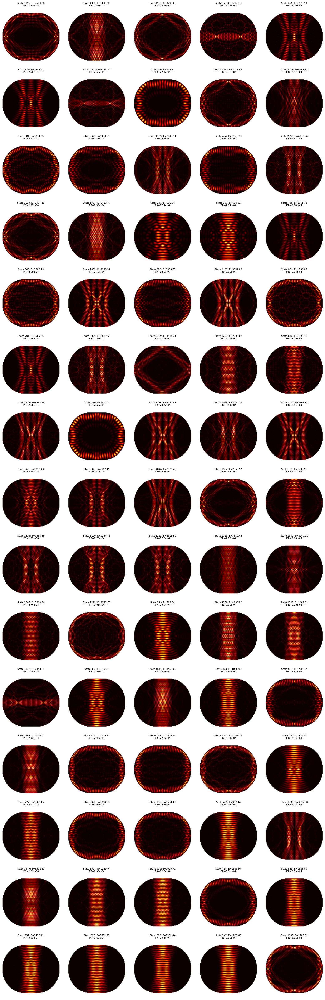

In [ ]:
iprs = [compute_ipr(psi, stadium_interior) for psi in stadium_wavefunctions]

# do the same plot but for the ones with highest ipr, and print their state number 
sorted_indices = np.argsort(iprs)[-75:]  # Get indices of 75 highest IPR states

fig, axes = plt.subplots(15, 5, figsize=(16, 48))  # 75 states: 15 rows x 5 columns
for ax, state_idx in zip(axes.flat, sorted_indices):
    psi = stadium_wavefunctions[state_idx]
    psi[~stadium_interior] = np.nan

    im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot', interpolation='bilinear')
    ax.set_title(f'State {state_idx+1}: E={stadium_eigenvalues[state_idx]:.2f}\nIPR={iprs[state_idx]:.2e}', fontsize=8)
    ax.axis('off')
    print(f"State {state_idx+1} (IPR={iprs[state_idx]:.2e})")

plt.tight_layout()
plt.show()


# Try similar with square

In [74]:
shape = create_rectangle(100, 100)
square_eigenvalues, square_wavefunctions, square_interior = solve_quantum_billiard(
    shape, Lx=2.0, Ly=2.0, n_eigenstates=1500  # Get more states!
)

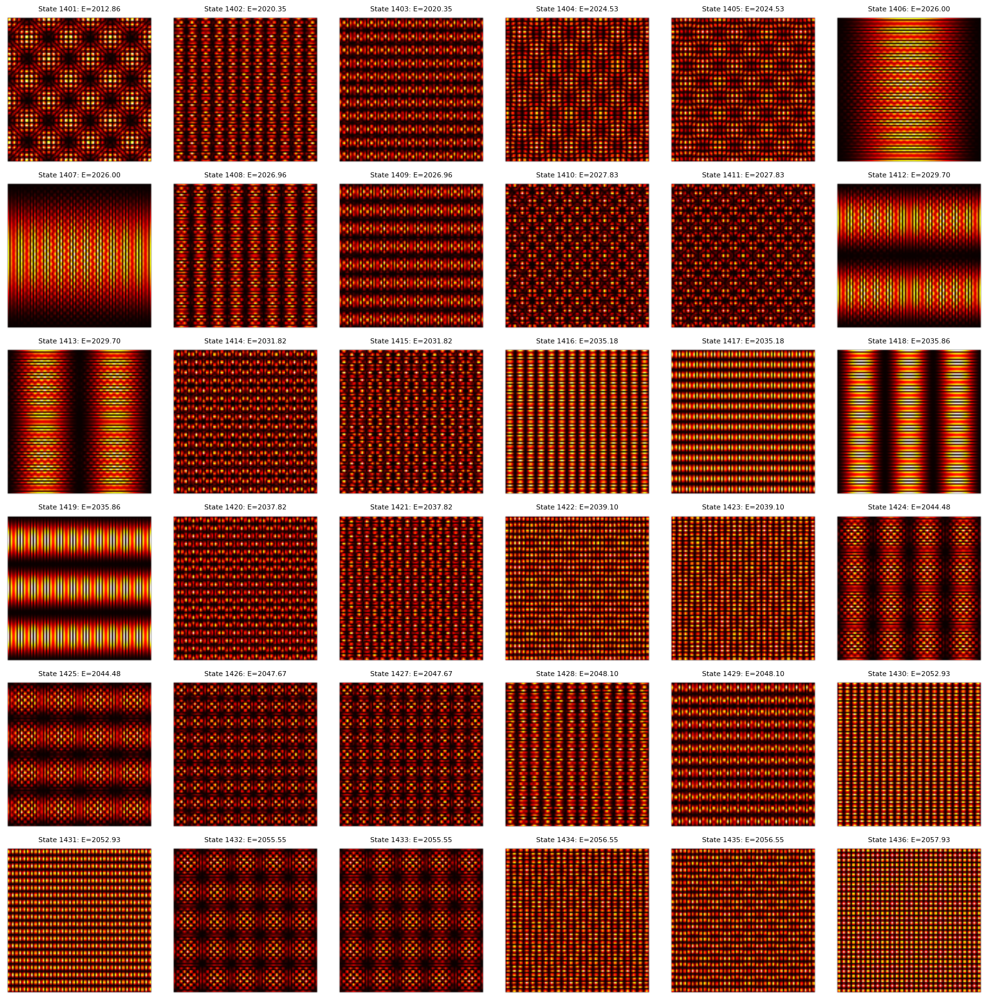

In [78]:
fig, axes = plt.subplots(6, 6, figsize=(16, 16))
for i, ax in enumerate(axes.flat):
    state_idx = i + 1400  # Start from state 15
    if state_idx < len(square_wavefunctions):
        psi = square_wavefunctions[state_idx]
        psi[~square_interior] = np.nan

        im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot',
                      interpolation='bilinear')
        ax.set_title(f'State {state_idx+1}: E={square_eigenvalues[state_idx]:.2f}',
                    fontsize=8)
        ax.axis('off')

plt.tight_layout()
plt.show()

State 1246 (IPR=2.68e-04)
State 585 (IPR=2.68e-04)
State 584 (IPR=2.68e-04)
State 1243 (IPR=2.68e-04)
State 1244 (IPR=2.68e-04)
State 543 (IPR=2.68e-04)
State 544 (IPR=2.68e-04)
State 324 (IPR=2.68e-04)
State 323 (IPR=2.68e-04)
State 1315 (IPR=2.68e-04)
State 1316 (IPR=2.68e-04)
State 616 (IPR=2.68e-04)
State 615 (IPR=2.68e-04)
State 85 (IPR=2.68e-04)
State 84 (IPR=2.68e-04)
State 1441 (IPR=2.68e-04)
State 1442 (IPR=2.68e-04)
State 1249 (IPR=2.68e-04)
State 1250 (IPR=2.68e-04)
State 1382 (IPR=2.68e-04)
State 1383 (IPR=2.68e-04)
State 1386 (IPR=2.68e-04)
State 1387 (IPR=2.68e-04)
State 1207 (IPR=2.68e-04)
State 1206 (IPR=2.68e-04)


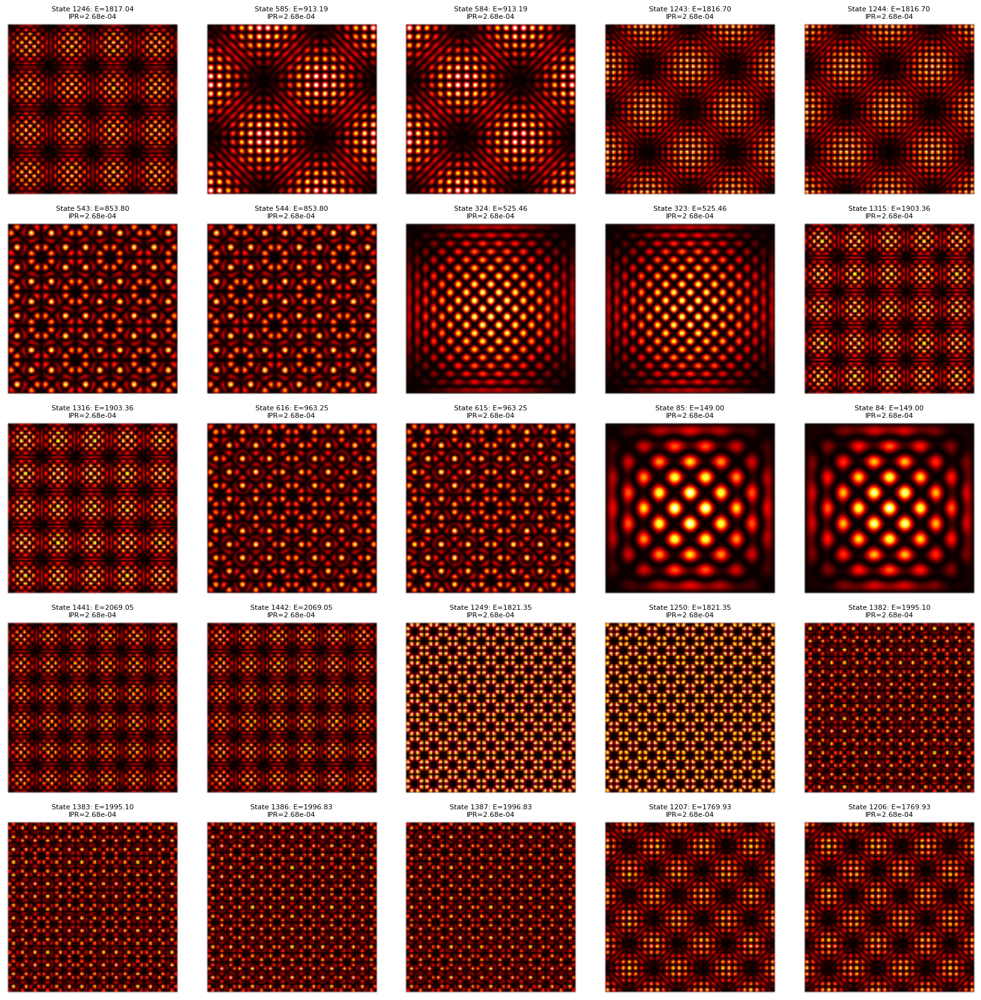

In [79]:
iprs = [compute_ipr(psi, square_interior) for psi in square_wavefunctions]

# do the same plot but for the ones with highest ipr, and print their state number 
sorted_indices = np.argsort(iprs)[-25:]  # Get indices of 25 highest IPR states

fig, axes = plt.subplots(5, 5, figsize=(16, 16))  # 25 states: 5 rows x 5 columns
for ax, state_idx in zip(axes.flat, sorted_indices):
    psi = square_wavefunctions[state_idx]
    psi[~square_interior] = np.nan

    im = ax.imshow(np.abs(psi)**2, origin='lower', cmap='hot', interpolation='bilinear')
    ax.set_title(f'State {state_idx+1}: E={square_eigenvalues[state_idx]:.2f}\nIPR={iprs[state_idx]:.2e}', fontsize=8)
    ax.axis('off')
    print(f"State {state_idx+1} (IPR={iprs[state_idx]:.2e})")

plt.tight_layout()
plt.show()
